<a href="https://www.kaggle.com/code/kevinnkansah/russian-painting-classification-lstm-convnet?scriptVersionId=184276759" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

from nltk.corpus import stopwords
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPooling2D,
    GlobalAveragePooling2D,
    Flatten,
    Dense,
    Embedding,
    LSTM,
    concatenate,
    Dropout,
)

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

from wordcloud import WordCloud
import os
import re

import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_colwidth", None)

2024-06-19 00:01:10.121243: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-19 00:01:10.121366: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-19 00:01:10.255339: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
df = pd.read_csv("/kaggle/input/russian-classic-painting-dataset/description.csv")
df.drop(["ru_title", "ru_author"], inplace=True, axis=1)

## Data Cleaning

Here I am just sorting images by their numbers **(useful when working locally)**

In [3]:
df["temp"] = df["filename"].apply(lambda x: int(x.split("/")[-1].split(".")[0]))
df = df.sort_values(by="temp").reset_index().drop(["temp", "index"], axis=1)
df["filename"] = df["filename"].apply(
    lambda x: "/kaggle/input/russian-classic-painting-dataset/data/" + x.split("/")[-1]
)
df.head(20)

,filename,gpt_description,eng_title,eng_author
0,/kaggle/input/russian-classic-painting-dataset/data/133.jpg,a painting of a group of people sitting at a table,Café in Paris,Petrov-Vodkin Kuzma Sergeyevich
1,/kaggle/input/russian-classic-painting-dataset/data/171.jpg,a painting of two people sitting on a wall,Bummers.,Ilya Efimovich Repin
2,/kaggle/input/russian-classic-painting-dataset/data/220.jpg,a painting of people in a kitchen,Samarkand,Petrov-Vodkin Kuzma Sergeyevich
3,/kaggle/input/russian-classic-painting-dataset/data/327.jpg,a painting of a woman in a red dress,The daughter of artist Tatiana and her family in the interior.,Ilya Efimovich Repin
4,/kaggle/input/russian-classic-painting-dataset/data/375.jpg,a painting of a man reading to two men,Eduard Franzovich Header and Bedrzhi Sokana,Ilya Efimovich Repin
5,/kaggle/input/russian-classic-painting-dataset/data/378.jpg,a painting of a street scene with a building and a red aw,"The stage design for the opera ""Orlean Virgin"" of Peter Chaikovsky",Petrov-Vodkin Kuzma Sergeyevich
6,/kaggle/input/russian-classic-painting-dataset/data/575.jpg,two men at a table with flowers and books,Lev Tolstoy and his wife in Clear Paul,Ilya Efimovich Repin
7,/kaggle/input/russian-classic-painting-dataset/data/605.jpg,a painting of people sitting at tables in a restaurant,Paris Café,Ilya Efimovich Repin
8,/kaggle/input/russian-classic-painting-dataset/data/611.jpg,a drawing of a man with a beard,A sketch of a Cossack from Zaporozhya.,Ilya Efimovich Repin
9,/kaggle/input/russian-classic-painting-dataset/data/650.jpg,a painting of a woman holding a baby,A Godmother With a Baby,Petrov-Vodkin Kuzma Sergeyevich


## Data Visualization

Description WordCloud

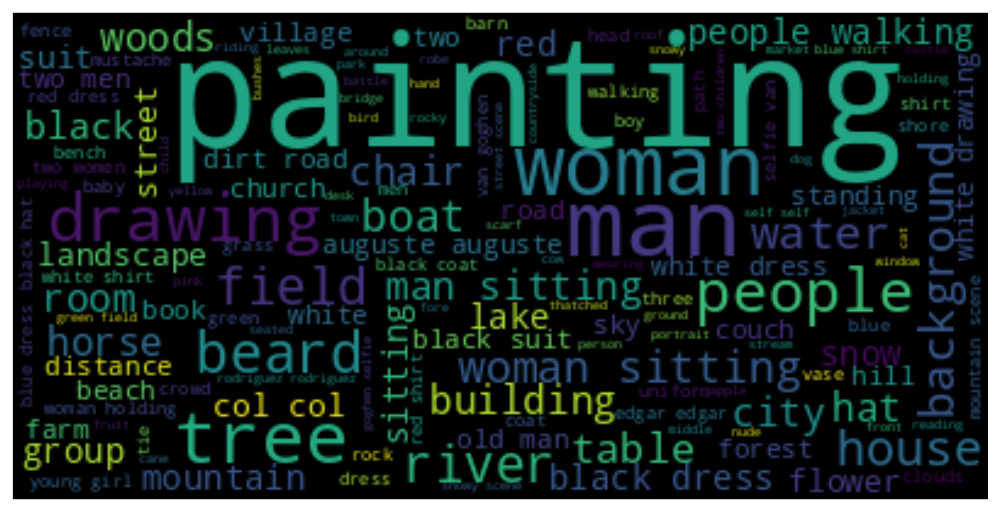

In [4]:
text = " ".join(df["gpt_description"].astype(str))
stop_words = set(stopwords.words("english"))
wordcloud = WordCloud(stopwords=stop_words).generate(text)
plt.figure(figsize=(10, 6), dpi=500)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Title WordCloud

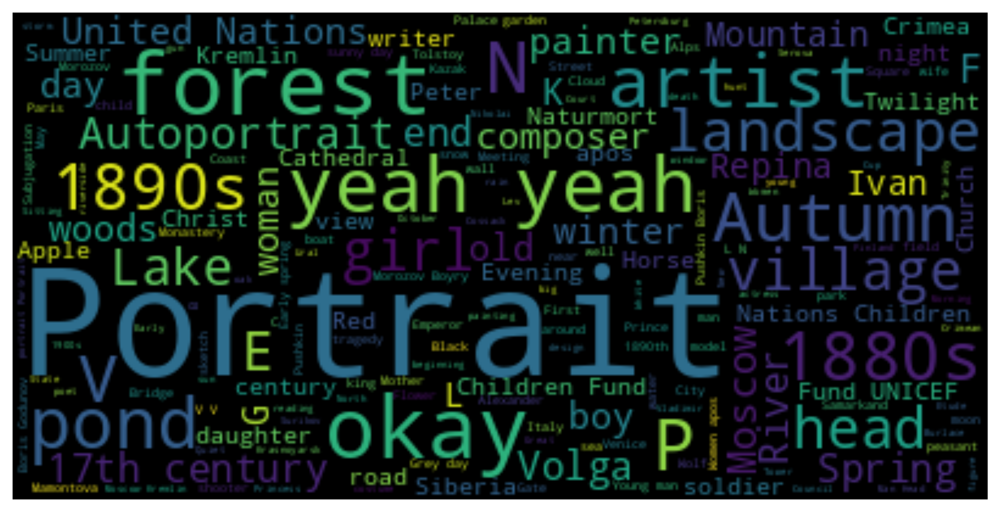

In [5]:
text = " ".join(df["eng_title"].astype(str))
stop_words = set(stopwords.words("english"))
wordcloud = WordCloud(stopwords=stop_words).generate(text)

plt.figure(figsize=(10, 6), dpi=500)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

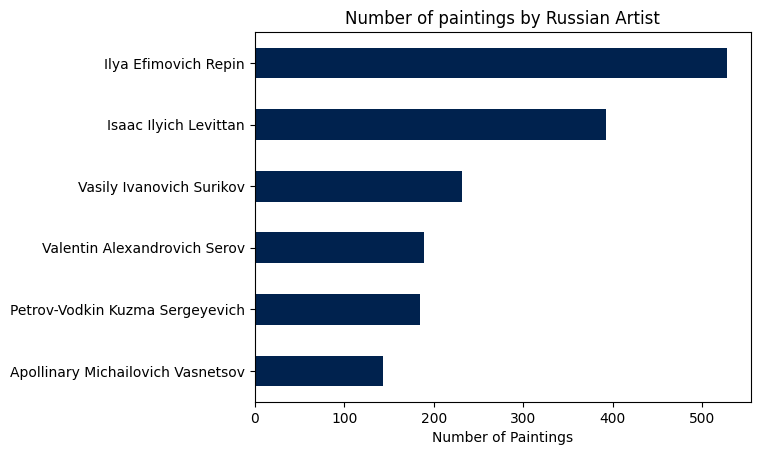

In [6]:
df["eng_author"].value_counts().plot(kind="barh", colormap="cividis")
plt.title("Number of paintings by Russian Artist")
plt.gca().invert_yaxis()
plt.ylabel("")
plt.xlabel("Number of Paintings")
plt.show()

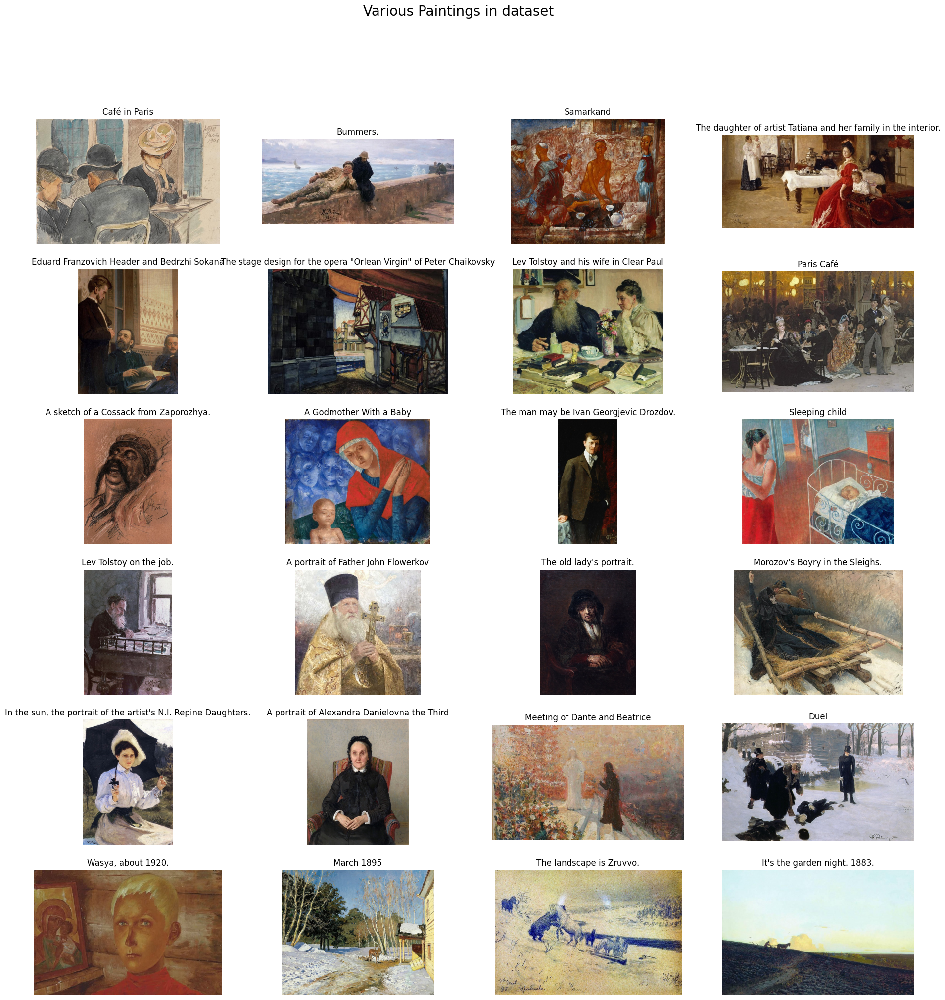

In [7]:
fig, axs = plt.subplots(6, 4, figsize=(23, 23))

axs = axs.flatten()
plt.suptitle("Various Paintings in dataset", fontsize=20)
for i, (filename, title) in enumerate(zip(df["filename"], df["eng_title"])):
    try:
        file_name = filename
        image = imread(file_name)
        ax = axs[i]
        ax.set_title(title)
        ax.imshow(image)
        ax.axis("off")
    except IndexError:
        break

plt.show()

## Data Preprocessing

In [8]:
def remove_stopwords(text):
    words = text.split()
    filtered_words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

df['eng_title'] = df['eng_title'].apply(remove_stopwords)
df['gpt_description'] = df['gpt_description'].apply(remove_stopwords)

In [9]:
def preproccess_images(img_filepath):
    images = []
    descriptions = []
    titles = []
    for index, row in df.iterrows():
        img_path = row["filename"]
        img = load_img(img_path, target_size=(224, 224))
        img = img_to_array(img) / 255
        images.append(img)
        descriptions.append(row["gpt_description"])
        titles.append(row["eng_title"])

    return np.array(images), descriptions, titles


images, descriptions, titles = preproccess_images(df["filename"])

Getting the vocab size of the title and description columns. These values will be used in the `input_dim` parameter of the `Embedding` layer of title and description models.

In [10]:
words_in_description = list()

for row in df["gpt_description"]:
    words = row.split(" ")
    for word in words:
        words_in_description.append(word)

nunique_words_in_des = len(set(words_in_description))

words_in_title = list()

for row in df["eng_title"]:
    words = row.split(" ")
    for word in words:
        words_in_title.append(word)
        
nunique_words_in_title = len(set(words_in_title))


print(f"Vocab size of gpt_description column: {nunique_words_in_des}")
print(f"Vocab size of eng_title column: {nunique_words_in_title}")

Vocab size of gpt_description column: 498
Vocab size of eng_title column: 2492


In [11]:
word_tokenizer = Tokenizer(num_words=nunique_words_in_des)

word_tokenizer.fit_on_texts(titles)
titles_seq = word_tokenizer.texts_to_sequences(titles)
titles_padded = pad_sequences(titles_seq, maxlen=20)

word_tokenizer.fit_on_texts(descriptions)
descriptions_seq = word_tokenizer.texts_to_sequences(descriptions)
descriptions_padded = pad_sequences(descriptions_seq, maxlen=20)

In [12]:
labels = df["eng_author"].unique()
label_with_index = {label: index for index, label in enumerate(labels)}
y = df["eng_author"].map(label_with_index)
y = to_categorical(y)


X_train_img, X_tmp_img, X_train_des, X_tmp_des, X_train_title, X_tmp_title = (
    train_test_split(
        images, descriptions_padded, titles_padded, test_size=0.3, random_state=42
    )
)

X_val_img, X_test_img, X_val_des, X_test_des, X_val_title, X_test_title = (
    train_test_split(X_tmp_img, X_tmp_des, X_tmp_title, test_size=0.5, random_state=42)
)

y_train, y_tmp = train_test_split(y, test_size=0.3, random_state=42)
y_val, y_test = train_test_split(y_tmp, test_size=0.5, random_state=42)

## Data Modelling

In [13]:
image_model = Sequential(name="Image_Model")
image_model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(224, 224, 3)))
image_model.add(MaxPooling2D((2, 2)))
image_model.add(Conv2D(64, (3, 3), activation="relu"))
image_model.add(MaxPooling2D((2, 2)))
image_model.add(Conv2D(64, (3, 3), activation="relu"))
image_model.add(MaxPooling2D((2, 2)))
image_model.add(Conv2D(64, (3, 3), activation="relu"))
image_model.add(Flatten())
image_model.add(Dropout(0.3))

description_model = Sequential(name="Description_Model")
description_model.add(Embedding(input_dim=nunique_words_in_des, output_dim=256, input_length=20))
description_model.add(LSTM(256))

title_model = Sequential(name="Title_Model")
title_model.add(Embedding(input_dim=nunique_words_in_title, output_dim=256, input_length=20))
title_model.add(LSTM(256))

image_input = Input(shape=(224, 224, 3), name="Image Input Layer")
image_output = image_model(image_input)

description_input = Input(shape=(20,), name="Description Input Layer")
description_output = description_model(description_input)

title_input = Input(shape=(20,), name="Title Input Layer")
title_output = title_model(title_input)

model_inputs = concatenate([image_output, description_output, title_output], name="Combined_Model")
model_inputs = Dropout(0.3, name="Dropout")(model_inputs)
model_output = Dense(6, name="Output_Layer",  activation="softmax")(model_inputs)

model = Model(
    inputs=[image_input, description_input, title_input], outputs=model_output
)

model.compile(optimizer="nadam", loss="categorical_crossentropy", metrics=["accuracy"])

In [14]:
model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Image Input Layer   │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Description Input   │ (None, 20)        │          0 │ -                 │
│ Layer (InputLayer)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Title Input Layer   │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Image_Model         │ (None, 36864)     │     93,248 │ Image Input       │
│ (Sequential)        │                   │            │ Layer[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Description_Model   │ (None, 256)       │    652,800 │ Description Input │
│ (Sequential)        │                   │            │ Layer[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Title_Model         │ (None, 256)       │  1,163,264 │ Title Input       │
│ (Sequential)        │                   │            │ Layer[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Combined_Model      │ (None, 37376)     │          0 │ Image_Model[0][0… │
│ (Concatenate)       │                   │            │ Description_Mode… │
│                     │                   │            │ Title_Model[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dropout (Dropout)   │ (None, 37376)     │          0 │ Combined_Model[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Output_Layer        │ (None, 6)         │    224,262 │ Dropout[0][0]     │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,133,574 (8.14 MB)

 Trainable params: 2,133,574 (8.14 MB)

 Non-trainable params: 0 (0.00 B)

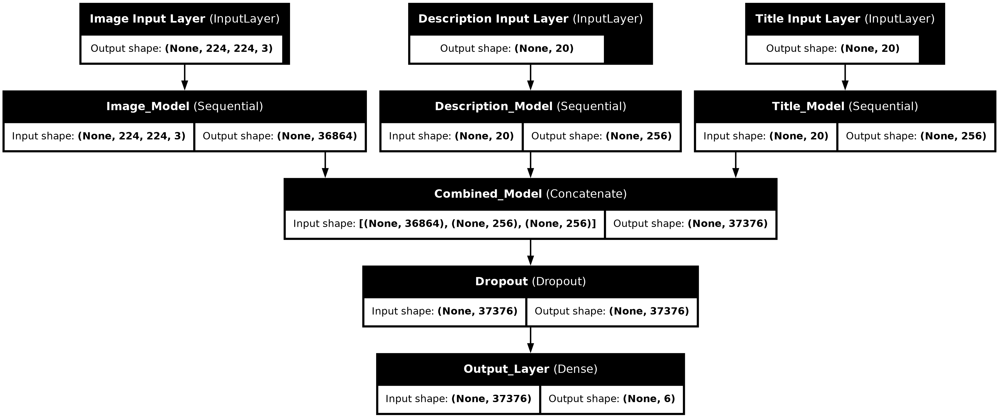

In [15]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [16]:
history = model.fit(
    [X_train_img, X_train_des, X_train_title],
    y_train,
    validation_data=([X_val_img, X_val_des, X_val_title], y_val),
    epochs=6,
    batch_size=2,
)

Epoch 1/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.4086 - loss: 1.5356 - val_accuracy: 0.7440 - val_loss: 0.8287
Epoch 2/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7676 - loss: 0.6958 - val_accuracy: 0.7960 - val_loss: 0.6750
Epoch 3/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.8550 - loss: 0.3912 - val_accuracy: 0.7800 - val_loss: 0.6897
Epoch 4/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.9055 - loss: 0.3073 - val_accuracy: 0.7960 - val_loss: 0.7095
Epoch 5/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.9440 - loss: 0.1723 - val_accuracy: 0.7600 - val_loss: 0.9070
Epoch 6/6
585/585 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.9553 - loss: 0.1378 - val_accuracy: 0.7520 - val_loss: 0.8603


## Model Evaluation

In [17]:
model.evaluate([X_test_img, X_test_des, X_test_title], y_test)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.7599 - loss: 1.1162


[1.062361717224121, 0.7529880404472351]

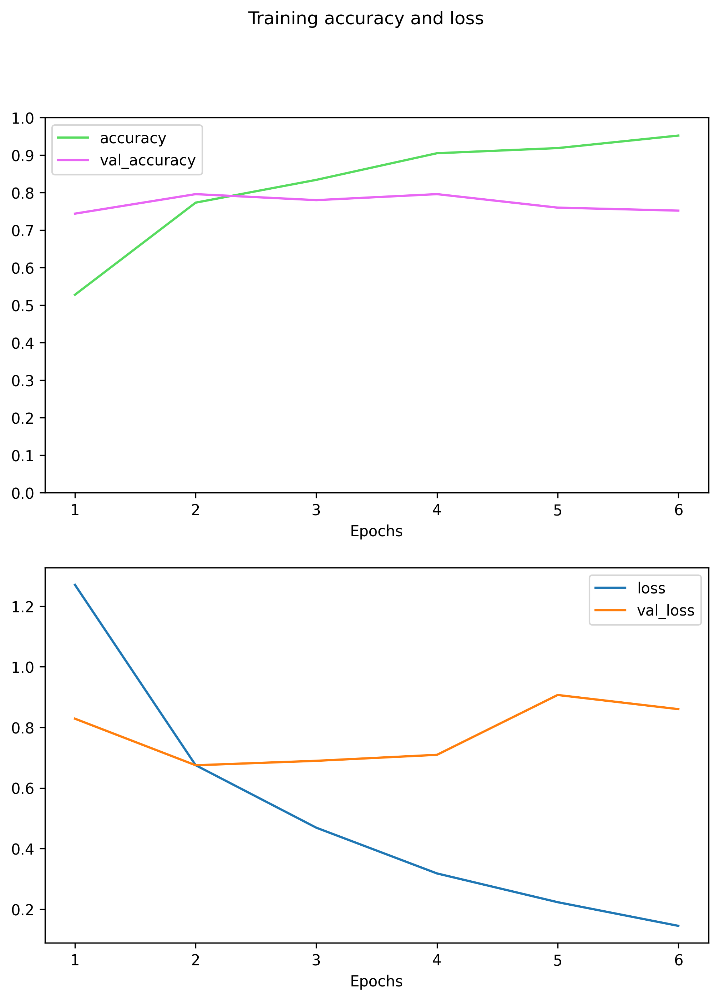

In [18]:
acc_loss_metrics = history.history

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(8, 10), dpi=300)
plt.suptitle("Training accuracy and loss")
for lable, values in acc_loss_metrics.items():
    if lable == "accuracy":
        ax[0].plot(values, label=lable, color=sns.color_palette("hls")[2])
    elif lable == "val_accuracy":
        ax[0].plot(values, label=lable, color=sns.color_palette("husl")[5])
    else:
        ax[1].plot(values, label=lable)

ax[0].set_xlabel("Epochs")
ax[0].set_xticklabels(np.arange(1, 7))
ax[0].set_xticks(np.arange(0, 6))
ax[0].set_yticks(np.arange(0, 1.1, 0.1))
ax[0].legend()

ax[1].set_xlabel("Epochs")
ax[1].set_xticklabels(np.arange(1, 7))
ax[1].set_xticks(np.arange(0, 6))
ax[1].legend()
plt.show()

In [19]:
y_pred = model.predict([X_test_img, X_test_des, X_test_title])

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


In [20]:
y_pred = np.argmax(y_pred, axis=1)

In [21]:
y_test = np.argmax(y_test, axis=1)

In [22]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.84      0.83        32
           1       0.84      0.86      0.85        69
           2       0.62      0.67      0.64        36
           3       0.79      0.82      0.81        66
           4       0.55      0.55      0.55        22
           5       0.68      0.50      0.58        26

    accuracy                           0.75       251
   macro avg       0.72      0.70      0.71       251
weighted avg       0.75      0.75      0.75       251



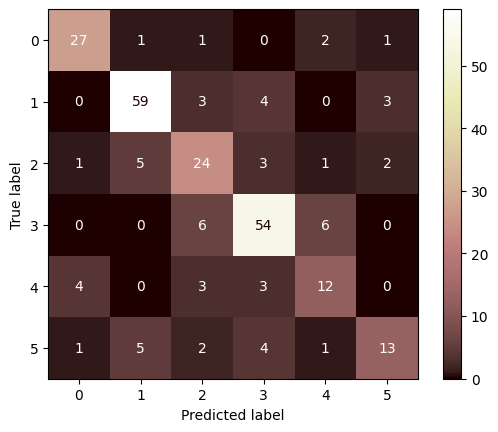

In [23]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='pink')
plt.show()

#### I am still learning so I am welcoming any suggestions or advise